In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Rescaling
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


from glob import glob
from PIL import Image
import pathlib

In [ ]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

data_dir

228813984/228813984 [==============================] - 2s 0us/step


PosixPath('/root/.keras/datasets/flower_photos')

In [ ]:
!ls -l /root/.keras/datasets/flower_photos/

total 620
drwx------ 2 270850 5000  36864 Feb 10  2016 daisy
drwx------ 2 270850 5000  45056 Feb 10  2016 dandelion
-rw-r----- 1 270850 5000 418049 Feb  9  2016 LICENSE.txt
drwx------ 2 270850 5000  36864 Feb 10  2016 roses
drwx------ 2 270850 5000  36864 Feb 10  2016 sunflowers
drwx------ 2 270850 5000  45056 Feb 10  2016 tulips


In [ ]:
!ls -l /root/.keras/datasets/flower_photos/daisy | grep jpg | wc -l
!ls -l /root/.keras/datasets/flower_photos/dandelion | grep jpg | wc -l
!ls -l /root/.keras/datasets/flower_photos/dandelion | grep jpg | wc -l
!ls -l /root/.keras/datasets/flower_photos/roses | grep jpg | wc -l
!ls -l /root/.keras/datasets/flower_photos/sunflowers | grep jpg | wc -l

633
898
898
641
699


In [ ]:
# Image path define
daisy_path = '/root/.keras/datasets/flower_photos/daisy/'
dandelion_path = '/root/.keras/datasets/flower_photos/dandelion/'
roses_path = '/root/.keras/datasets/flower_photos/roses/'
sunflowers_path = '/root/.keras/datasets/flower_photos/sunflowers/'
tulips_path = '/root/.keras/datasets/flower_photos/tulips/'

In [ ]:
# Images lists
daisy_file = os.listdir(daisy_path)
dandelion_file = os.listdir(dandelion_path)
roses_file = os.listdir(roses_path)
sunflowers_file = os.listdir(sunflowers_path)
tulips_file = os.listdir(tulips_path)

In [ ]:
# Check Image lists
#daisy_file[:2], roses_file[:2]

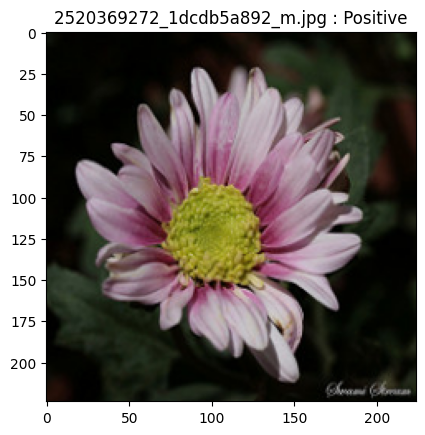

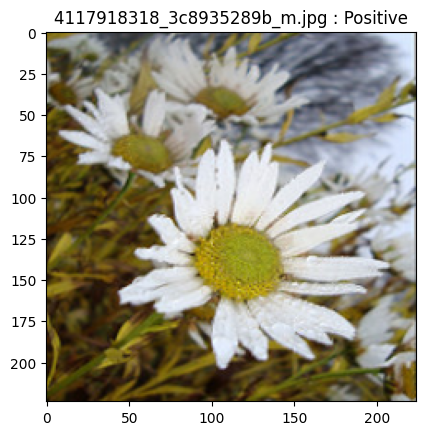

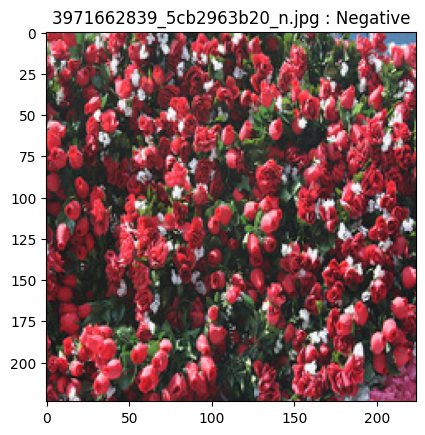

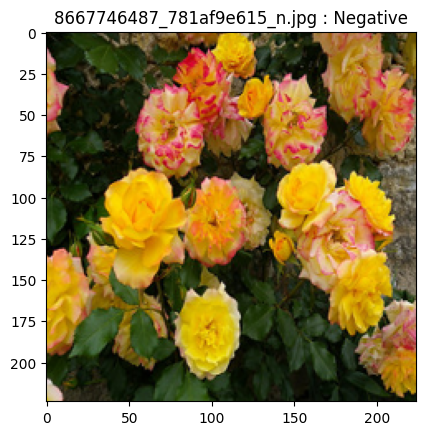

In [ ]:
# Check images and drawing two sets images
for img_file in daisy_file[:2] :
    img = Image.open(daisy_path + img_file).resize((224,224))
    plt.title(img_file + ' : Positive')
    plt.imshow(img)
    plt.show()

for img_file in roses_file[:2] :
    img = Image.open(roses_path + img_file).resize((224,224))
    plt.title(img_file + ' : Negative')
    plt.imshow(img)
    plt.show()

In [ ]:
# Label define : class

class2idx = {'daisy' :  0, 'dandelion' : 1,  'roses' : 2, 'sunflowers' : 3, 'tulips' : 4}
idx2class = {0 : 'daisy', 1 : 'dandelion', 2 : 'roses', 3 : 'sunflowers', 4 : 'tulips'}


In [ ]:
# Convert data and label manually

img_list = []
label_list = []

daisy_file = os.listdir(daisy_path)
for img_file in daisy_file :
  img = Image.open(daisy_path + img_file).resize((128,128))
  img = np.array(img)/255.  # scaling
  img_list.append(img)
  label_list.append(0) # daisy : 0

dandelion_file = os.listdir(dandelion_path)
for img_file in dandelion_file :
  img = Image.open(dandelion_path + img_file).resize((128,128))
  img = np.array(img)/255.  # scaling
  img_list.append(img)
  label_list.append(1) # dandelion : 1

roses_file = os.listdir(roses_path)
for img_file in roses_file :
  img = Image.open(roses_path + img_file).resize((128,128))
  img = np.array(img)/255.  # scaling
  img_list.append(img)
  label_list.append(2) # roses : 2

sunflowers_file = os.listdir(sunflowers_path)
for img_file in sunflowers_file :
  img = Image.open(sunflowers_path + img_file).resize((128,128))
  img = np.array(img)/255.  # scaling
  img_list.append(img)
  label_list.append(3) # sunflowers : 3

tulips_file = os.listdir(tulips_path)
for img_file in tulips_file :
  img = Image.open(tulips_path + img_file).resize((128,128))
  img = np.array(img)/255.  # scaling
  img_list.append(img)
  label_list.append(4) # tulips : 4

In [ ]:
# image data, label to numpy array
img_list_arr =  np.array(img_list)
label_list_arr = np.array(label_list)

In [ ]:
# check shape of data, label
img_list_arr.shape, label_list_arr.shape

((3670, 128, 128, 3), (3670,))

In [ ]:
# train test split
from sklearn.model_selection import train_test_split

X_train, X_test , y_train, y_test = train_test_split(img_list_arr, label_list_arr,
                                                     test_size=0.3, stratify=label_list_arr, random_state=41)
X_train.shape, X_test.shape , y_train.shape, y_test.shape

((2569, 128, 128, 3), (1101, 128, 128, 3), (2569,), (1101,))

In [ ]:
# Build - Hyperparameter Tunning
num_epochs = 10
batch_size = 32
learning_rate = 0.001
dropout_rate = 0.5
input_shape = (128, 128, 3) #check shape

In [ ]:
# Modeling
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

model = Sequential()
#model.add(Conv2D(32, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=input_shape))
#model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Conv2D(32, kernel_size=5,activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(64,(2,2), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Dropout(0.2))
model.add(Flatten())

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(5, activation='softmax'))

In [ ]:
model.compile(optimizer='adam', #tf.keras.optimizers.Adam(learning_rate),
              loss='sparse_categorical_crossentropy', # why sparse - Loss Function
              metrics=['accuracy'])  # Metrics / Accuracy

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2  (None, 62, 62, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 62, 62, 64)        8256      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 31, 31, 64)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 31, 31, 64)        0         
                                                                 
 flatten (Flatten)           (None, 61504)             0

In [ ]:
# callback : EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
checkpoint_path = "my_checkpoint.ckpt"
mc = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)

In [ ]:
# num_epochs = 10, # batch_size = 32
# training
history = model.fit(X_train, y_train ,
    validation_data=(X_test, y_test),
    epochs=num_epochs,
    batch_size=batch_size,
    callbacks=[es, mc]
)

Epoch 1/10
81/81 [==============================] - ETA: 0s - loss: 1.6755 - accuracy: 0.3044
Epoch 1: val_loss improved from inf to 1.31180, saving model to my_checkpoint.ckpt
81/81 [==============================] - 99s 1s/step - loss: 1.6755 - accuracy: 0.3044 - val_loss: 1.3118 - val_accuracy: 0.4532
Epoch 2/10
81/81 [==============================] - ETA: 0s - loss: 1.2636 - accuracy: 0.4543
Epoch 2: val_loss improved from 1.31180 to 1.16167, saving model to my_checkpoint.ckpt
81/81 [==============================] - 78s 968ms/step - loss: 1.2636 - accuracy: 0.4543 - val_loss: 1.1617 - val_accuracy: 0.5132
Epoch 3/10
81/81 [==============================] - ETA: 0s - loss: 1.1539 - accuracy: 0.5403
Epoch 3: val_loss did not improve from 1.16167
81/81 [==============================] - 77s 953ms/step - loss: 1.1539 - accuracy: 0.5403 - val_loss: 1.1789 - val_accuracy: 0.4995
Epoch 4/10
81/81 [==============================] - ETA: 0s - loss: 1.0337 - accuracy: 0.5917
Epoch 4: val_l

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

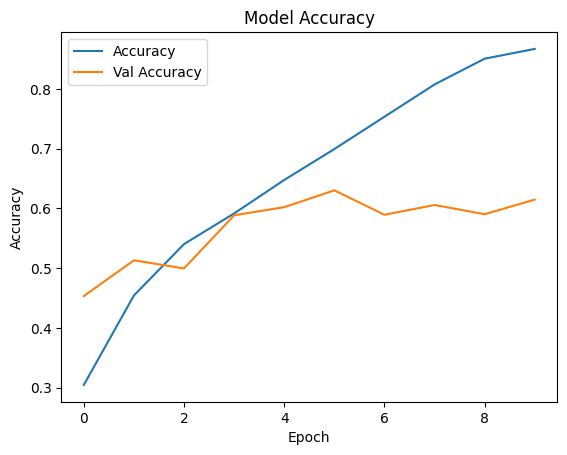

In [ ]:
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

1/1 [==============================] - 0s 48ms/step


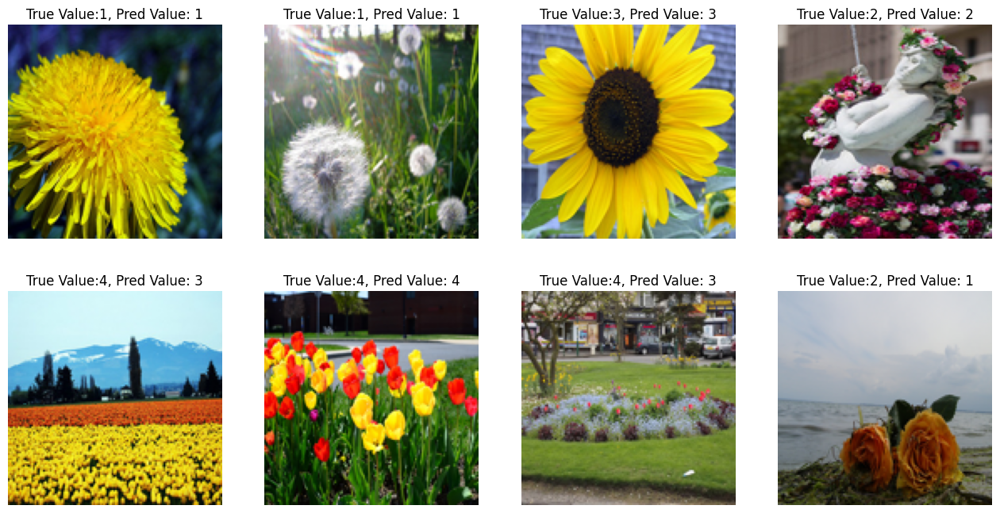

In [ ]:
# Predict using Test data
i=1
plt.figure(figsize=(16, 8))
for img, label in zip(X_test[:8], y_test[:8]):
      # predict
      pred = model.predict(img.reshape(-1,128, 128, 3))
      pred_t = np.argmax(pred)
      plt.subplot(2, 4, i)
      plt.title(f'True Value:{label}, Pred Value: {pred_t}')
      plt.imshow(img)
      plt.axis('off')
      i = i + 1

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Rescaling
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from glob import glob
from PIL import Image
import pathlib

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)
data_dir

!ls -l /root/.keras/datasets/flower_photos/

#check fiel and draw sample image
daisy_file = os.listdir(daisy_path)
daisy_file[:2]

for img_file in daisy_file[:2] :
    img = Image.open(daisy_path + img_file).resize((224,224))
    plt.title(img_file + ' : Positive')
    plt.imshow(img)
    plt.show()

In [ ]:
# image_dataset_from_directory
# - onehot encoding labeling - image deployment - shuffle
# hyper params
input_shape = (224, 224, 3)
batch_size = 32
num_classes = 5

#image path
img_path ='/root/.keras/datasets/flower_photos/'

# train dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
                                             directory=img_path,
                                             label_mode="categorical",   # binary , categorical
                                             batch_size=batch_size,
                                             image_size=(224, 224),      # input shape
                                             seed=42,
                                             shuffle=True,
                                             validation_split=0.2,
                                             subset="training"    # "training"/"validation". Only used if validation_split is set.
                                            )

# test dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
                                             directory=img_path,
                                             label_mode="categorical",   # binary , categorical
                                             batch_size=batch_size,
                                             image_size=(224, 224),      # input shape
                                             seed=42,
                                             validation_split=0.2,
                                             subset="validation"
                                            )

Found 3670 files belonging to 5 classes.
Using 2936 files for training.
Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [ ]:
# check class name
train_ds.class_names #train_ds.element_spec
# check total data. batch_size = 32
# len(train_ds) * 32 , len(test_ds) * 32

import matplotlib.pyplot as plt
#batch_img, batch_label = next(iter(train_ds))
#batch_img.shape, batch_label.shape

# check Image
#batch_img, batch_label = next(iter(train_ds))
#image = batch_img[0]  # Get a single image
#plt.imshow(image/255)
#plt.show()
#print(batch_label[0])  # View the image's label

# check sample image
i = 0
for batch_img, batch_label in train_ds.take(1): #take(1) get one from batch. take(32) get 32 from batch
  if i == 0 :
    print(batch_img[i].shape)
    plt.imshow(batch_img[i]/255)
  i = i + 1

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [ ]:
#modeling
# Hyperparameter Tunning

num_epochs = 10
batch_size = 32

learning_rate = 0.001
dropout_rate = 0.5

input_shape = (224, 224, 3)  # 사이즈 확인
num_classes = 5

In [ ]:
model = Sequential()
model.add(Rescaling(1. / 255))  # 이미지 Rescaling. 없이 하면 성능이 안나옴.
model.add(Conv2D(32, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Conv2D(64,(2,2), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(5, activation='softmax'))

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])  # Metrics / Accuracy

model.summary()

In [ ]:
# EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)
checkpoint_path = "my_checkpoint.ckpt"
mc = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)

In [ ]:
# image_dataset_from_directory, then go ahead
# num_epochs = 10
history = model.fit(train_ds,
                    validation_data=(test_ds),
                    epochs=10,
                    callbacks=[es, mc]
                    )

Epoch 1/10
92/92 [==============================] - ETA: 0s - loss: 1.7541 - accuracy: 0.3876
Epoch 1: val_loss improved from inf to 1.13477, saving model to my_checkpoint.ckpt
92/92 [==============================] - 21s 163ms/step - loss: 1.7541 - accuracy: 0.3876 - val_loss: 1.1348 - val_accuracy: 0.5014
Epoch 2/10
92/92 [==============================] - ETA: 0s - loss: 1.0928 - accuracy: 0.5538
Epoch 2: val_loss improved from 1.13477 to 1.04685, saving model to my_checkpoint.ckpt
92/92 [==============================] - 11s 118ms/step - loss: 1.0928 - accuracy: 0.5538 - val_loss: 1.0469 - val_accuracy: 0.5668
Epoch 3/10
92/92 [==============================] - ETA: 0s - loss: 0.8886 - accuracy: 0.6502
Epoch 3: val_loss improved from 1.04685 to 0.97436, saving model to my_checkpoint.ckpt
92/92 [==============================] - 12s 122ms/step - loss: 0.8886 - accuracy: 0.6502 - val_loss: 0.9744 - val_accuracy: 0.6144
Epoch 4/10
92/92 [==============================] - ETA: 0s - los

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

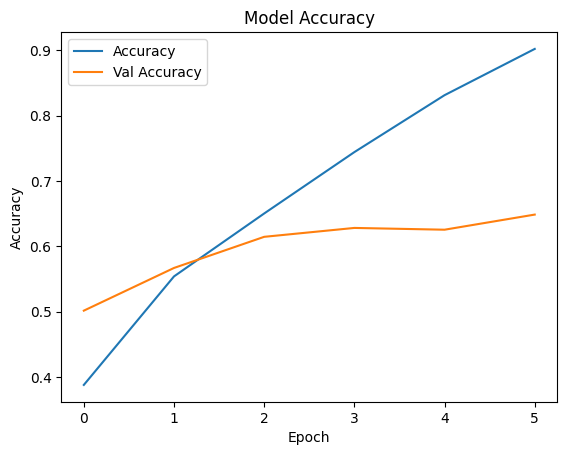

In [ ]:
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

In [ ]:
# predict trial
batch_img , batch_label = next(iter(test_ds))
batch_img.shape, batch_img.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 224, 224, 3]))

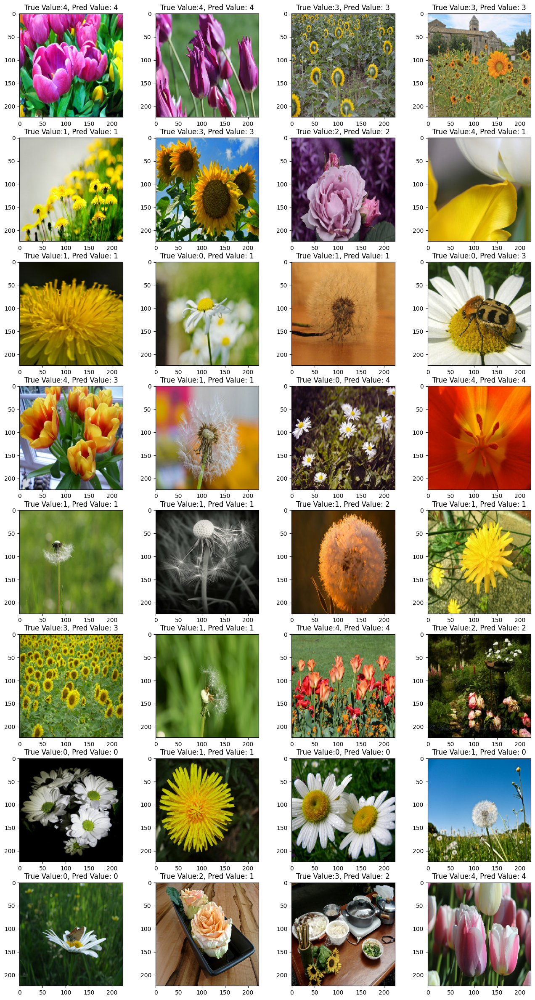

In [ ]:
# predict - performance

i = 1
plt.figure(figsize=(16, 30))
for img, label in list(zip(batch_img, batch_label)):
    pred = model.predict(img.numpy().reshape(-1, 224,224,3), verbose=0)
    pred_t = np.argmax(pred)
    plt.subplot(8, 4, i)
    plt.title(f'True Value:{np.argmax(label)}, Pred Value: {pred_t}')
    plt.imshow(img/255)  # Image pixeles are float, so make values 0~1
    i = i + 1


## E. MobileNet Transfer Learning & Fine-tuning 모델링

### 1. Build Model

In [ ]:
# 케라스 applicatioins에 어떤 종류의 모델 있는지 확인
dir(tf.keras.applications)

['ConvNeXtBase',
 'ConvNeXtLarge',
 'ConvNeXtSmall',
 'ConvNeXtTiny',
 'ConvNeXtXLarge',
 'DenseNet121',
 'DenseNet169',
 'DenseNet201',
 'EfficientNetB0',
 'EfficientNetB1',
 'EfficientNetB2',
 'EfficientNetB3',
 'EfficientNetB4',
 'EfficientNetB5',
 'EfficientNetB6',
 'EfficientNetB7',
 'EfficientNetV2B0',
 'EfficientNetV2B1',
 'EfficientNetV2B2',
 'EfficientNetV2B3',
 'EfficientNetV2L',
 'EfficientNetV2M',
 'EfficientNetV2S',
 'InceptionResNetV2',
 'InceptionV3',
 'MobileNet',
 'MobileNetV2',
 'MobileNetV3Large',
 'MobileNetV3Small',
 'NASNetLarge',
 'NASNetMobile',
 'RegNetX002',
 'RegNetX004',
 'RegNetX006',
 'RegNetX008',
 'RegNetX016',
 'RegNetX032',
 'RegNetX040',
 'RegNetX064',
 'RegNetX080',
 'RegNetX120',
 'RegNetX160',
 'RegNetX320',
 'RegNetY002',
 'RegNetY004',
 'RegNetY006',
 'RegNetY008',
 'RegNetY016',
 'RegNetY032',
 'RegNetY040',
 'RegNetY064',
 'RegNetY080',
 'RegNetY120',
 'RegNetY160',
 'RegNetY320',
 'ResNet101',
 'ResNet101V2',
 'ResNet152',
 'ResNet152V2',
 'Re

In [ ]:
# 사전 훈련된 모델 MobileNetV2에서 기본 모델을 생성합니다.
# 아래와 같은 형식을 MobileNetV2 Transfer Learning 사용하며 됩니다.

base_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), weights='imagenet', include_top=False)

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[

In [ ]:
# tf.keras.applications.MobileNetV2 모델은 [-1, 1]의 픽셀 값을 예상하지만 이 시점에서 이미지의 픽셀 값은 [0, 255]입니다.
# MobileNetV2 모델에서 제대로 수행하기 위해 크기를 [-1, 1]로 재조정해야 합니다.(안하고 수행해도 성능 잘 나옴)
# 방법 2가지 있음
# 첫번째 방법 : preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
# 두번째 방법 : rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

In [ ]:
# MobileNet V2 베이스 모델 고정하기
base_model.trainable = False

In [ ]:
# 모델 구축 : 이미지 픽셀값 조정 수행하기(Rescaling) --> 성능 더 잘 나옴.

inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.layers.Rescaling(1./127.5, offset=-1)(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.x = tf.keras.layers.GlobalAveragePooling2D()(x)  # 3차원(7, 7, 1280) --> 1차원(1280)으로 줄이기 : GlobalAveragePooling2D
output = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=output)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 5)                 6405      
                                                                 
Total params: 2264389 (8.64 MB)
Trainable params: 6405 (25.02

In [ ]:
# 모델 compile

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),  # Optimization
              loss='categorical_crossentropy',  # Loss Function
              metrics=['accuracy'])             # Metrics / Accuracy

### 2. Callback

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# EarlyStopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)

# ModelCheckpoint
checkpoint_path = "my_checkpoint.ckpt"
checkpoint = ModelCheckpoint(filepath=checkpoint_path,
                             save_best_only=True,
                             monitor='val_loss',
                             verbose=1)

### 3. 모델 학습

In [ ]:
# image_dataset_from_directory 이용하여 DataSet을 만들었으며
# num_epochs = 10
# batch_size = 32

history = model.fit(
    train_ds,
    validation_data = test_ds,
    epochs=2,
    callbacks=[es, checkpoint]
)

Epoch 1/2
92/92 [==============================] - ETA: 0s - loss: 0.7439 - accuracy: 0.7272
Epoch 1: val_loss improved from inf to 0.45918, saving model to my_checkpoint.ckpt
92/92 [==============================] - 30s 282ms/step - loss: 0.7439 - accuracy: 0.7272 - val_loss: 0.4592 - val_accuracy: 0.8392
Epoch 2/2
91/92 [============================>.] - ETA: 0s - loss: 0.3657 - accuracy: 0.8767
Epoch 2: val_loss improved from 0.45918 to 0.41092, saving model to my_checkpoint.ckpt
92/92 [==============================] - 23s 250ms/step - loss: 0.3653 - accuracy: 0.8767 - val_loss: 0.4109 - val_accuracy: 0.8733


### 4. 성능 그래프

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

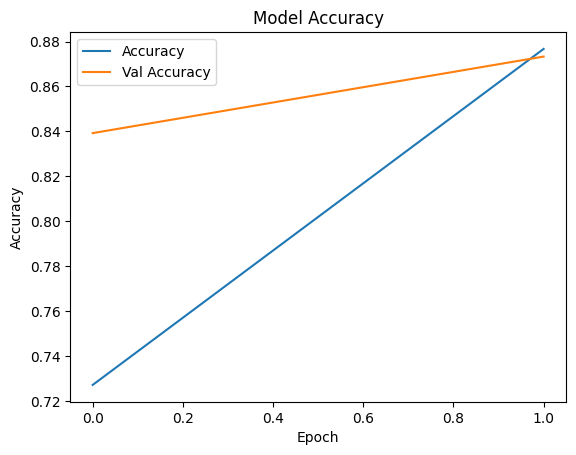

In [ ]:
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy')
plt.show()

### 5. Predict

In [ ]:
# test_generator 샘플 데이터 가져오기
# 배치 사이즈 32 확인

batch_img, batch_label = next(iter(test_ds))
print(batch_img.shape)
print(batch_label.shape)

(32, 224, 224, 3)
(32, 5)


In [ ]:
# 이미지 rescale 되어 있는 상태
batch_img[0][0][:10]

<tf.Tensor: shape=(10, 3), dtype=float32, numpy=
array([[ 96.     , 152.21428, 203.64285],
       [ 94.71429, 153.64285, 206.     ],
       [ 94.21429, 153.85715, 208.     ],
       [ 97.5    , 151.     , 207.5    ],
       [ 96.14285, 150.92857, 207.     ],
       [ 92.57143, 151.85715, 207.78572],
       [ 93.14285, 149.57143, 209.42857],
       [ 96.42857, 153.64285, 207.57143],
       [ 98.     , 156.     , 206.     ],
       [ 95.85714, 155.92857, 210.14285]], dtype=float32)>

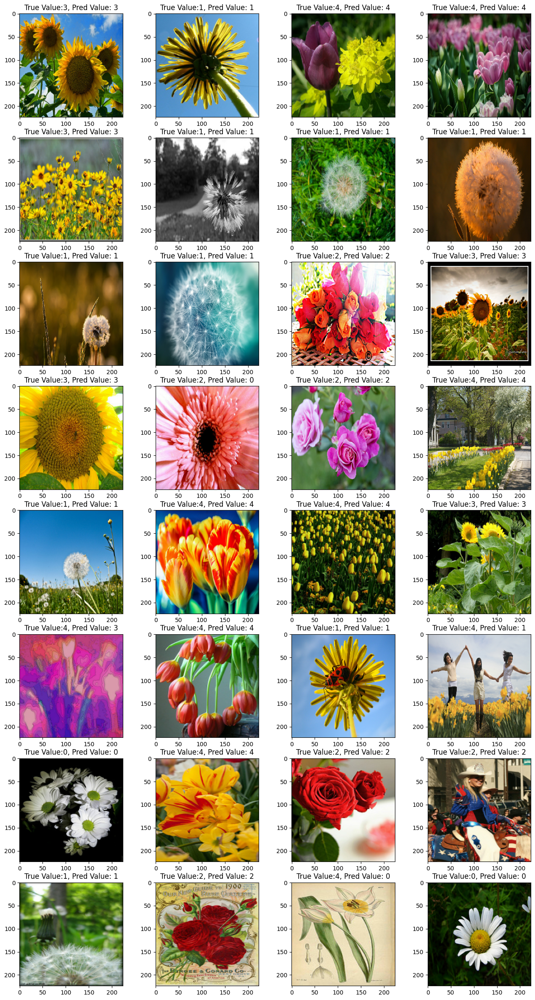

In [ ]:
# 100% 성능 보여줌

i = 1
plt.figure(figsize=(16, 30))
for img, label in list(zip(batch_img, batch_label)):
    pred = model.predict(img.numpy().reshape(-1, 224,224,3), verbose=0)
    pred_t = np.argmax(pred)
    plt.subplot(8, 4, i)
    plt.title(f'True Value:{np.argmax(label)}, Pred Value: {pred_t}')
    plt.imshow(img/255)  # 이미지 픽셀값들이 실수형이므로 0~1 사이로 변경해야 에러 안남
    i = i + 1

## 배운 내용 정리
1. Transfer Learning을 사용하는 방법을 배웠으며 이를 통해 성능을 올릴수 있었습니다.
2. 여러분도 Transfer Learning을 사용하는 방법을 숙지해서 이용할수 있으면 좋겠네요.